
## Installing IceVision



In [1]:
!wget https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
!bash install_colab.sh

--2021-11-21 14:53:33--  https://raw.githubusercontent.com/airctic/icevision/master/install_colab.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 723 [text/plain]
Saving to: ‘install_colab.sh’

install_colab.sh    100%[===================>]     723  --.-KB/s    in 0s      

2021-11-21 14:53:33 (31.4 MB/s) - ‘install_colab.sh’ saved [723/723]

- Installing mmcv
     |████████████████████████████████| 51.3 MB 63 kB/s 
     |████████████████████████████████| 185 kB 5.0 MB/s 
- Installing mmdet
     |████████████████████████████████| 1.2 MB 5.3 MB/s 
- Installing icevision from master
     |████████████████████████████████| 56 kB 2.4 MB/s 
     |████████████████████████████████| 98 kB 4.7 MB/s 
     |████████████████████████████████| 57 kB 4.4 MB/s 
     |███

## Imports

In [ ]:
from icevision.all import *

## Clone the PlantDoc dataset repository


In [ ]:
!git clone https://github.com/pratikkayal/PlantDoc-Object-Detection-Dataset.git

## Change current the directory

In [ ]:
# Change current directory
%cd PlantDoc-Object-Detection-Dataset/

/content/PlantDoc-Object-Detection-Dataset


## Quick Data Exploration using the compiled annotations in the CSV file

In [ ]:
import pandas as pd

annot = pd.read_csv('train_labels.csv')
annot.rename(columns={'class':'label'}, inplace=True) # to avoid semantic conflicts
annot.sample(5)

,filename,width,height,label,xmin,ymin,xmax,ymax
5398,BacterialSpot17.jpg,300,450,Bell_pepper leaf spot,57,328,122,417
7315,dsc00849.jpg,5456,3632,grape leaf,2286,134,3038,618
7087,img_6564.jpg,3612,2365,Tomato Septoria leaf spot,874,811,1672,1542
4255,cherry-leaves-e1335624103663.jpg,2000,2666,Cherry leaf,1,924,821,1493
7755,tomato-leaf-herbicide-damage.jpg,500,375,Tomato leaf mosaic virus,120,286,189,364


In [ ]:
annot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8469 entries, 0 to 8468
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  8469 non-null   object
 1   width     8469 non-null   int64 
 2   height    8469 non-null   int64 
 3   label     8469 non-null   object
 4   xmin      8469 non-null   int64 
 5   ymin      8469 non-null   int64 
 6   xmax      8469 non-null   int64 
 7   ymax      8469 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 529.4+ KB


In [ ]:
annot.filename.nunique()

2345

In [ ]:
len(annot.label.unique().tolist())

29

In [ ]:
_CLASSES = annot["label"].unique().tolist()
_CLASSES

['Cherry leaf',
 'Peach leaf',
 'Corn leaf blight',
 'Apple rust leaf',
 'Potato leaf late blight',
 'Strawberry leaf',
 'Corn rust leaf',
 'Tomato leaf late blight',
 'Tomato mold leaf',
 'Potato leaf early blight',
 'Apple leaf',
 'Tomato leaf yellow virus',
 'Blueberry leaf',
 'Tomato leaf mosaic virus',
 'Raspberry leaf',
 'Tomato leaf bacterial spot',
 'Squash Powdery mildew leaf',
 'grape leaf',
 'Corn Gray leaf spot',
 'Tomato Early blight leaf',
 'Apple Scab Leaf',
 'Tomato Septoria leaf spot',
 'Tomato leaf',
 'Soyabean leaf',
 'Bell_pepper leaf spot',
 'Bell_pepper leaf',
 'grape leaf black rot',
 'Potato leaf',
 'Tomato two spotted spider mites leaf']

The dataset obtained through git clone has 8,469 entries composed of 2,345 images containing 11 healthy and 18 diseased classes.


## Method 1: Using IceVision predefined VOC parser

In [ ]:
Path('./TRAIN').ls()

(#4720) [Path('TRAIN/Original_e-blight.JPG.rend.hgtvcom.966.725.jpeg.xml'),Path('TRAIN/Late-Blight-A.jpg'),Path('TRAIN/black-rot-guignardia-bidwellii-leaf-spot-lesions-on-muscadine-grape-x85jjd.xml'),Path('TRAIN/stock-photo-fresh-ripe-blueberries-with-leaves-on-white-background-125173964.jpg'),Path('TRAIN/Problem-2a.jpg'),Path('TRAIN/4-lagenaria_pdic.xml'),Path('TRAIN/23600077_1572609202782510_2145699867_o.jpg'),Path('TRAIN/depositphotos_164701744-stock-photo-closeup-of-strawberry-leaves.jpg'),Path('TRAIN/blueberry-goanp-nps.jpg'),Path('TRAIN/Black_Rot_of_Grapes151.xml')...]

The PlantDoc dataset uses the VOC annotation. Both the individual annotation files (xml) and the image files (jpg) are located in the **./TRAIN** folder.

In [ ]:
data_dir = Path('./TRAIN')

parser = parsers.voc(annotations_dir=data_dir, images_dir=data_dir)

train_records, valid_records = parser.parse()

  0%|          | 0/2356 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/1884 [00:00<?, ?it/s]

WARNING  - (record_id: 839) - 🚫 Record could not be autofixed and will be removed because: File 'TRAIN/NCLB.jpg' does not exist | icevision.core.record:autofix_records:104
WARNING  - (record_id: 1416) - 🚫 Record could not be autofixed and will be removed because: File 'TRAIN/early-blight-1.jpg' does not exist | icevision.core.record:autofix_records:104
AUTOFIX-SUCCESS - (record_id: 214) - Clipping bbox xmax from 525 to image width 0 (Before: <BBox (xmin:58, ymin:92, xmax:525, ymax:386)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 214) - Clipping bbox ymax from 386 to image height 0 (Before: <BBox (xmin:58, ymin:92, xmax:0, ymax:386)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-FAIL - (record_id: 214) - Cannot auto-fix coordinates: <BBox (xmin:58, ymin:92, xmax:0, ymax:0)>
	x_min:58 is greater than or equal to x_max:0
	y_min:92 is greater than or equal to y_max:0 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: 214) R

  0%|          | 0/471 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 2026) - Clipping bbox xmax from 430 to image width 0 (Before: <BBox (xmin:55, ymin:1, xmax:430, ymax:628)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 2026) - Clipping bbox ymax from 628 to image height 0 (Before: <BBox (xmin:55, ymin:1, xmax:0, ymax:628)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-FAIL - (record_id: 2026) - Cannot auto-fix coordinates: <BBox (xmin:55, ymin:1, xmax:0, ymax:0)>
	x_min:55 is greater than or equal to x_max:0
	y_min:1 is greater than or equal to y_max:0 | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-REPORT - (record_id: 2026) Removed annotation with index: 0, for more info check the AUTOFIX-FAIL messages above | icevision.core.record:autofix:50
WARNING  - (record_id: 1901) - 🚫 Record could not be autofixed and will be removed because: File 'TRAIN/powdery-mildew-on-squash-leaves.jpg' does not exist | icevision.core.record:autofix_records:104


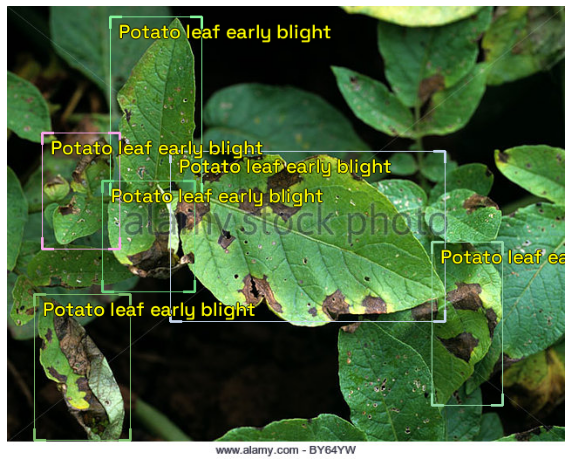

In [ ]:
show_records(train_records[0], font_size=24, label_color = '#ffff00')

In [ ]:
train_records[1]

BaseRecord

common: 
	- Record ID: 1866
	- Filepath: TRAIN/potato-early-blight-alternaria-alternata-target-spot-lesions-on-a-by64yw.jpg
	- Img: None
	- Image size ImgSize(width=640, height=519)
detection: 
	- Class Map: <ClassMap: {'background': 0, 'Cherry leaf': 1, 'Peach leaf': 2, 'Corn leaf blight': 3, 'Apple rust leaf': 4, 'Potato leaf late blight': 5, 'Strawberry leaf': 6, 'Corn rust leaf': 7, 'Tomato leaf late blight': 8, 'Tomato mold leaf': 9, 'Potato leaf early blight': 10, 'Apple leaf': 11, 'Tomato leaf yellow virus': 12, 'Blueberry leaf': 13, 'Tomato leaf mosaic virus': 14, 'Raspberry leaf': 15, 'Tomato leaf bacterial spot': 16, 'Squash Powdery mildew leaf': 17, 'grape leaf': 18, 'Corn Gray leaf spot': 19, 'Tomato Early blight leaf': 20, 'Apple Scab Leaf': 21, 'Tomato Septoria leaf spot': 22, 'Tomato leaf': 23, 'Soyabean leaf': 24, 'Bell_pepper leaf spot': 25, 'Bell_pepper leaf': 26, 'grape leaf black rot': 27, 'Potato leaf': 28, 'Tomato two spotted spider mites leaf': 29}>
	

## Method 2: Creating a Custom Parser

In [ ]:
template_record = ObjectDetectionRecord()

In [ ]:
# a general template that can guide in creating a parser
Parser.generate_template(template_record)

class MyParser(Parser):
    def __init__(self, template_record):
        super().__init__(template_record=template_record)
    def __iter__(self) -> Any:
    def __len__(self) -> int:
    def record_id(self, o: Any) -> Hashable:
    def parse_fields(self, o: Any, record: BaseRecord, is_new: bool):
        record.set_filepath(<Union[str, Path]>)
        record.set_img_size(<ImgSize>)
        record.detection.set_class_map(<ClassMap>)
        record.detection.add_labels(<Sequence[Hashable]>)
        record.detection.add_bboxes(<Sequence[BBox]>)


In [ ]:
#!ls

checkpoints  models  test_labels.csv  train_labels.csv
LICENSE.txt  TEST    TRAIN


In [ ]:
data_dir = Path(".") # the csv file is separate from the TRAIN folder

In [ ]:
class PlantDocParser(Parser):
    def __init__(self, template_record, data_dir):
        super().__init__(template_record=template_record)

        self.data_dir = data_dir
        self.df = pd.read_csv(data_dir / "train_labels.csv")
        self.df.rename(columns={'class':'label'}, inplace=True)
        self.class_map = ClassMap(list(self.df['label'].unique()))

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.filename

    def parse_fields(self, o, record, is_new):
        if is_new:
            filepath = self.data_dir / 'TRAIN' / o.filename
            record.set_filepath(filepath)
            if filepath.exists():
              image_size = get_img_size(filepath)
              record.set_img_size(image_size) #
            record.detection.set_class_map(self.class_map)

        record.detection.add_bboxes([BBox.from_xyxy(o.xmin, o.ymin, o.xmax, o.ymax)])
        record.detection.add_labels([o.label])

In [ ]:
parser_csv = PlantDocParser(template_record, data_dir)

train_records_csv, valid_records_csv = parser_csv.parse()

  0%|          | 0/8469 [00:00<?, ?it/s]

INFO     - Autofixing records | icevision.parsers.parser:parse:136


  0%|          | 0/1876 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 347) - Clipping bbox xmax from 3264 to image width 852 (Before: <BBox (xmin:1, ymin:1, xmax:3264, ymax:2443)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 347) - Clipping bbox ymax from 2443 to image height 639 (Before: <BBox (xmin:1, ymin:1, xmax:852, ymax:2443)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 1828) - Clipping bbox xmax from 851 to image width 750 (Before: <BBox (xmin:258, ymin:263, xmax:851, ymax:604)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 594) - Clipping bbox xmax from 3264 to image width 2448 (Before: <BBox (xmin:173, ymin:149, xmax:3264, ymax:2364)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 1207) - Clipping bbox xmax from 340 to image width 255 (Before: <BBox (xmin:1, ymin:47, xmax:340, ymax:234)>) | icevision.utils.logger_utils:autofix_log:17
WARNING  - (record_id: 3) - 🚫 Record could not be autofixed

  0%|          | 0/469 [00:00<?, ?it/s]

AUTOFIX-SUCCESS - (record_id: 1363) - Clipping bbox xmax from 3806 to image width 2592 (Before: <BBox (xmin:1, ymin:86, xmax:3806, ymax:2430)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 776) - Clipping bbox xmax from 3613 to image width 3024 (Before: <BBox (xmin:22, ymin:740, xmax:3613, ymax:3024)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 2278) - Clipping bbox xmax from 651 to image width 600 (Before: <BBox (xmin:363, ymin:139, xmax:651, ymax:507)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 31) - Clipping bbox xmax from 2354 to image width 2000 (Before: <BBox (xmin:738, ymin:610, xmax:2354, ymax:1679)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-SUCCESS - (record_id: 2018) - Clipping bbox xmax from 2255 to image width 1936 (Before: <BBox (xmin:1961, ymin:97, xmax:2255, ymax:843)>) | icevision.utils.logger_utils:autofix_log:17
AUTOFIX-FAIL - (record_id: 2018) - Cannot auto-

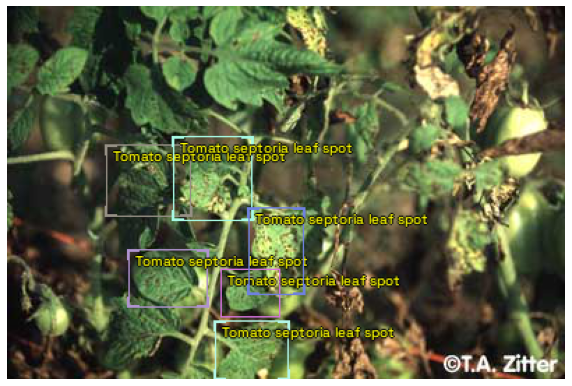

In [ ]:
show_record(train_records_csv[0], 
            figsize = (10,10), font_size=10, label_color = '#ffff00')

In [ ]:
train_records_csv[0]

BaseRecord

common: 
	- Record ID: 790
	- Filepath: TRAIN/Tom_Sept1.jpg
	- Img: None
	- Image size ImgSize(width=400, height=267)
detection: 
	- Class Map: <ClassMap: {'background': 0, 'Cherry leaf': 1, 'Peach leaf': 2, 'Corn leaf blight': 3, 'Apple rust leaf': 4, 'Potato leaf late blight': 5, 'Strawberry leaf': 6, 'Corn rust leaf': 7, 'Tomato leaf late blight': 8, 'Tomato mold leaf': 9, 'Potato leaf early blight': 10, 'Apple leaf': 11, 'Tomato leaf yellow virus': 12, 'Blueberry leaf': 13, 'Tomato leaf mosaic virus': 14, 'Raspberry leaf': 15, 'Tomato leaf bacterial spot': 16, 'Squash Powdery mildew leaf': 17, 'grape leaf': 18, 'Corn Gray leaf spot': 19, 'Tomato Early blight leaf': 20, 'Apple Scab Leaf': 21, 'Tomato Septoria leaf spot': 22, 'Tomato leaf': 23, 'Soyabean leaf': 24, 'Bell_pepper leaf spot': 25, 'Bell_pepper leaf': 26, 'grape leaf black rot': 27, 'Potato leaf': 28, 'Tomato two spotted spider mites leaf': 29}>
	- Labels: [22, 22, 22, 22, 22, 22]
	- BBoxes: [<BBox (xmin:71, y

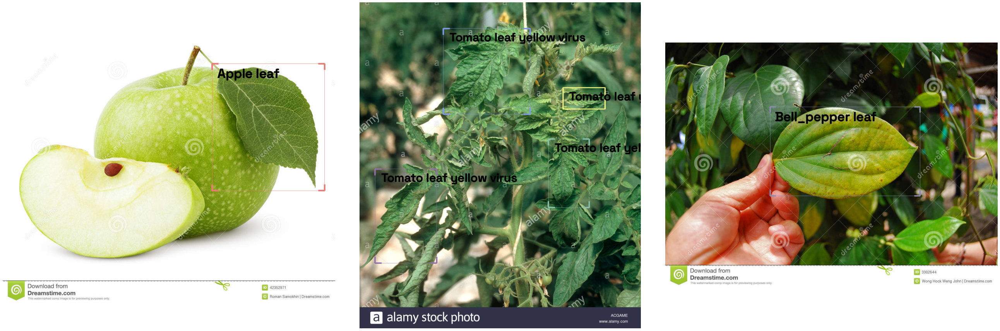

In [ ]:
show_records(train_records_csv[4:7], ncols=3,
             font_size=50, label_color = '#000000')

### Transforms

In [ ]:
presize = 512
image_size = 384

train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=image_size, presize=presize), tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size=image_size), tfms.A.Normalize()])

### Train and Validation Dataset Objects

In [ ]:
train_ds = Dataset(train_records_csv, train_tfms)
valid_ds = Dataset(valid_records_csv, valid_tfms)

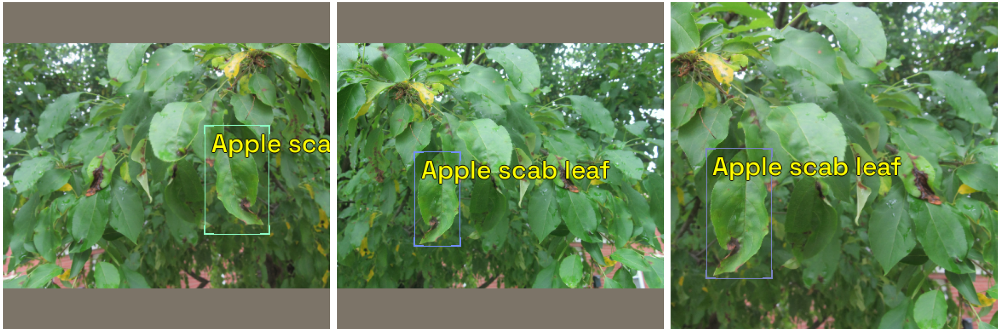

In [ ]:
samples = [train_ds[1] for _ in range(3)]
show_samples(samples, ncols=3, font_size=30, label_color = '#ffff00')

### Model

In [ ]:
selection = 3

extra_args = {}

if selection == 0:
  model_type = models.mmdet.retinanet
  backbone = model_type.backbones.resnet50_fpn_1x

elif selection == 1:
  # The Retinanet model is also implemented in the torchvision library
  model_type = models.torchvision.retinanet
  backbone = model_type.backbones.resnet50_fpn

elif selection == 2:
  model_type = models.ross.efficientdet
  backbone = model_type.backbones.tf_lite0
  # The efficientdet model requires an img_size parameter
  extra_args['img_size'] = image_size

elif selection == 3:
  model_type = models.ultralytics.yolov5
  backbone = model_type.backbones.small
  # The yolov5 model requires an img_size parameter
  extra_args['img_size'] = image_size

model = model_type.model(backbone=backbone(pretrained=True), num_classes=len(parser_csv.class_map), **extra_args) 

### DataLoaders

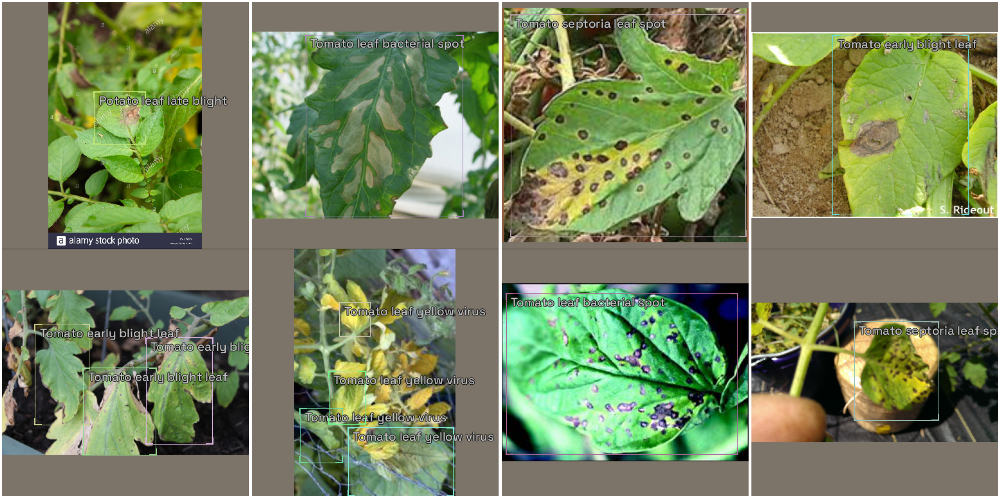

In [ ]:
train_dl = model_type.train_dl(train_ds, batch_size=8, num_workers=2, shuffle=True)
valid_dl = model_type.valid_dl(valid_ds, batch_size=8, num_workers=2, shuffle=False)

model_type.show_batch(first(valid_dl), ncols=4)

### Metrics and Learner

SuggestedLRs(lr_min=0.002290867641568184, lr_steep=9.12010818865383e-07)

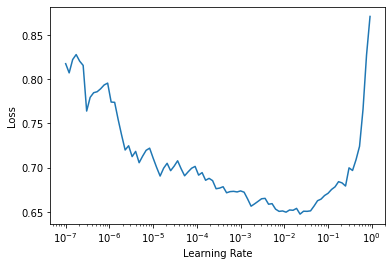

In [ ]:
metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]

learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics)

learn.lr_find()

In [ ]:
learn.fine_tune(30, 2e-3, freeze_epochs=1)

epoch,train_loss,valid_loss,COCOMetric,time
0,0.543996,0.597296,0.017532,01:09


epoch,train_loss,valid_loss,COCOMetric,time
0,0.467303,0.529751,0.047435,01:09
1,0.435613,0.491913,0.059765,01:08
2,0.412750,0.476506,0.080500,01:08
3,0.401774,0.466753,0.078446,01:08
4,0.395810,0.446768,0.100773,01:09
5,0.380553,0.433739,0.127285,01:07
6,0.382574,0.426688,0.113411,01:07


epoch,train_loss,valid_loss,COCOMetric,time
0,0.467303,0.529751,0.047435,01:09
1,0.435613,0.491913,0.059765,01:08
2,0.412750,0.476506,0.080500,01:08
3,0.401774,0.466753,0.078446,01:08
4,0.395810,0.446768,0.100773,01:09
5,0.380553,0.433739,0.127285,01:07
6,0.382574,0.426688,0.113411,01:07
7,0.375914,0.423286,0.149317,01:11
8,0.358875,0.405624,0.144083,01:10
9,0.355038,0.410427,0.157570,01:09


## Visualize Results

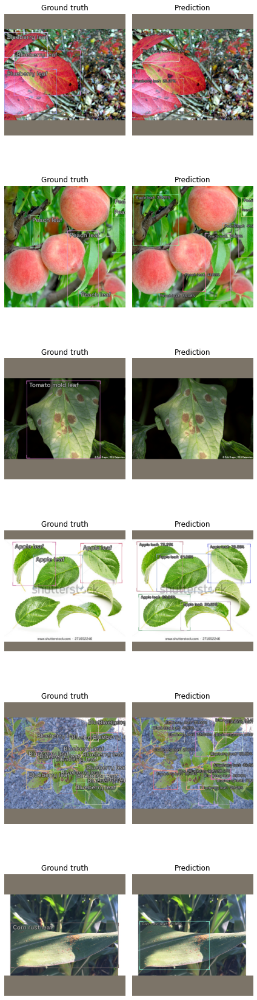

In [ ]:
model_type.show_results(model, valid_ds)

## Saving a Model on Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = Path('/content/gdrive/My Drive/')

>Note: Assuming the presence of a folder called **models** in your Google Drive

In [ ]:
fname_model = 'plantdoc-yolov5.pth'
torch.save(model.state_dict(), root_dir/'models'/fname_model)